<a href="https://colab.research.google.com/github/aoi-hill/Gans/blob/main/DCGan_Conditional_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import torch
import torchvision
from torchvision.datasets import CIFAR10
from torchvision import transforms
from torch.utils.data import DataLoader
from torch import nn
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
from torch.nn.utils import spectral_norm

torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):

    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [3]:
device = torch.device('cuda:0')

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
class Generator(nn.Module):
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64, classes = 10):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        self.cond_noise = [[] for i in range(3)]
        for _ in range(classes):
            self.cond_noise[0].append(
                nn.Sequential(
                    spectral_norm(nn.Linear(input_dim, 2*input_dim)).to(device),
                    #nn.BatchNorm1d(2*input_dim).to(device),
                    nn.ReLU().to(device),
                    spectral_norm(nn.Linear(2*input_dim, 4*input_dim)).to(device),
                    #nn.BatchNorm1d(4*input_dim).to(device),
                    nn.ReLU().to(device)
                )
            )
        for _ in range(classes):
            self.cond_noise[1].append(
                nn.Sequential(
                    spectral_norm(nn.Linear(4*input_dim, 8*input_dim)).to(device),
                    #nn.BatchNorm1d(8*input_dim).to(device),
                    nn.ReLU().to(device),
                    spectral_norm(nn.Linear(8*input_dim, 4*input_dim)).to(device),
                    #nn.BatchNorm1d(4*input_dim).to(device),
                    nn.ReLU()
                )
            )
        
        for _ in range(classes):
            self.cond_noise[2].append(
                nn.Sequential(
                    spectral_norm(nn.Linear(4*input_dim, 2*input_dim)).to(device),
                    #nn.BatchNorm1d(2*input_dim).to(device),
                    nn.ReLU().to(device),
                    spectral_norm(nn.Linear(2*input_dim, input_dim)).to(device),
                    #nn.BatchNorm1d(input_dim).to(device),
                    nn.ReLU().to(device)
                )
            )

        self.res1 = nn.Linear(input_dim, 4*input_dim)
        self.res3 = nn.Linear(4*input_dim, input_dim)
        

        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim*8, kernel_size=4, stride=1, padding=0),
            self.make_gen_block(hidden_dim*8, hidden_dim * 4, kernel_size=4, stride=2, padding=1),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=2, padding=1),
            self.make_gen_block(hidden_dim * 2, im_chan, kernel_size=4, stride=2, padding=1, final_layer=True)
            #self.make_gen_block(hidden_dim, im_chan, kernel_size=4, stride=2, padding=1, final_layer=True),
        )

    def make_gen_block(self, input_dim, output_dim, kernel_size=3, stride=2, padding=0, final_layer=False):
        if not final_layer:
            return(nn.Sequential(
                spectral_norm(nn.ConvTranspose2d(input_dim, output_dim, kernel_size, stride, padding)),
                nn.BatchNorm2d(output_dim),
                nn.ReLU(inplace=True)
            ))
        else:
            return nn.Sequential(
                spectral_norm(nn.ConvTranspose2d(input_dim, output_dim, kernel_size, stride, padding)),
                nn.Tanh())

    def forward(self, noise, class_):
        class_noise = {}
        for i in range(10): #no. of classes
            class_noise[i] = torch.tensor([[] for j in range(noise.shape[0])]).to(device)

        # print(noise.shape)
        
        for i in range(len(class_)):
            class_noise[class_[i].item()] = torch.cat([class_noise[class_[i].item()],noise[:,i:i+1]],dim=1)
        
        for i in range(10): #no. of classes
            class_noise[i] = class_noise[i].view(class_noise[i].shape[1],class_noise[i].shape[0])
            # print(class_noise[i].shape)
        
        fin = torch.tensor([[] for _ in range(self.input_dim)]).to(device)
        new_label = torch.tensor([]).to(device)
        for i in range(10):
            if not torch.numel(class_noise[i]):
                continue
            new_label = torch.cat([new_label,torch.tensor([i]*class_noise[i].shape[0]).to(device)])
            x = self.cond_noise[0][i](class_noise[i])
            x = x + self.res1(class_noise[i])
            x = self.cond_noise[1][i](x)
            x1 = self.res3(x)
            x = self.cond_noise[2][i](x)
            x = x + x1
            x = x.view(self.input_dim,x.shape[0])
            fin = torch.cat([fin,x],dim=1)
        fin = fin.view(fin.shape[1],fin.shape[0],1,1)
        # print(new_label.shape,'=====================')
        return self.gen(fin),new_label

def get_noise(n_samples, input_dim, device='cpu'):
    return torch.randn(input_dim,n_samples).to(device)

  

In [6]:
print(torch.numel(torch.tensor([[]])))

0


In [7]:
class Discriminator(nn.Module):
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.hidden_dim = hidden_dim
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim, begin=True),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim*2, hidden_dim * 4),
            #self.make_disc_block(hidden_dim*4, 1, final_layer=True)
            #self.make_disc_block(hidden_dim*8, 1, final_layer=True),
        )
        self.fin = self.make_disc_block(4*hidden_dim + 10, 1, final_layer=True)

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, padding=1, final_layer=False, begin=False):

        if not final_layer and not begin:
            return nn.Sequential(
                spectral_norm(nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding, bias=False)),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        elif not final_layer:
             return nn.Sequential(
                spectral_norm(nn.Conv2d(input_channels, output_channels, kernel_size, stride,padding, bias=False)),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                spectral_norm(nn.Conv2d(input_channels, output_channels, kernel_size = 4, stride = 1 , padding= 0 , bias=False)),
            )

    def forward(self, img, one_hot_img):
        disc_pred = self.disc(img)
        image_one_hot = one_hot_img[:,:,None,None].repeat(1,1,disc_pred.shape[2],disc_pred.shape[3])
        #print(disc_pred.shape,image_one_hot.shape)
        x = combine_vectors(disc_pred,image_one_hot) 
        #print(x.shape)
        disc_fin_inp = self.fin(x)
       
        return disc_pred.view(len(disc_pred), -1)


In [8]:
import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    return F.one_hot(labels, n_classes)

In [9]:
def combine_vectors(x, y):
    return torch.cat((x,y),dim=1)

In [14]:
batch_size= 256
n_epochs = 200
lr = 0.0002
z_dim = 128
display_step = 500
criterion = nn.BCEWithLogitsLoss()
cifar10_shape = (3,32,32)

transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))])

dataloader_train = DataLoader(
    CIFAR10('/content/drive/MyDrive/Colab Notebooks/data',train=True, download= True, transform = transform),
    batch_size = batch_size,
    drop_last=True,
    shuffle = True
)

dataloader_test = DataLoader(
    CIFAR10('/content/drive/MyDrive/Colab Notebooks/data',train=False, download= True, transform = transform),
    batch_size = batch_size,
    drop_last=True,
    shuffle = True
)

Files already downloaded and verified
Files already downloaded and verified


In [15]:
def get_input_dimensions(z_dim, CIFAR10_shape, n_classes):
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = CIFAR10_shape[0] + n_classes
    return generator_input_dim, discriminator_im_chan

In [16]:
# gen_inp1, disc_inp1 = get_input_dimensions(z_dim, cifar10_shape, 10)

gen = Generator(z_dim,3).to(device)
gen_opt = torch.optim.Adam(gen.parameters(),lr,[0.5,0.999])
disc = Discriminator(3).to(device)
disc_opt = torch.optim.Adam(disc.parameters(),lr,[0.5,0.999])

def weights_init(m):
    if isinstance(m,nn.Conv2d) or isinstance(m,nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight,0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
        
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  0%|          | 0/195 [00:00<?, ?it/s]

Working Now !


  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 500: Generator loss: 0.6912843111753464, discriminator loss: 0.6899018925428391


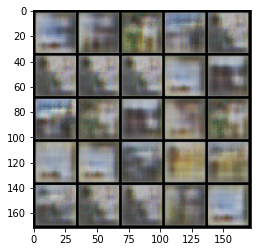

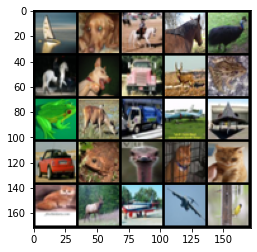

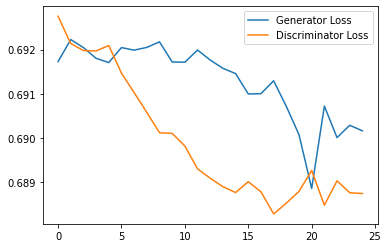

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 1000: Generator loss: 0.688527068734169, discriminator loss: 0.6905441299676895


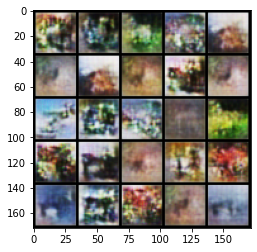

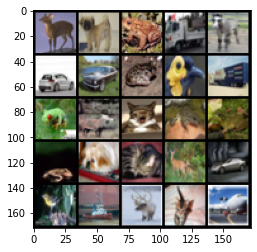

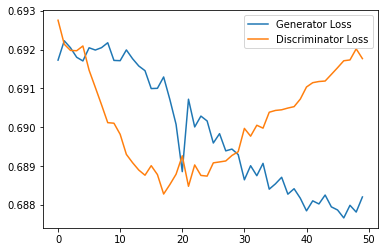

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 1500: Generator loss: 0.6902109863758087, discriminator loss: 0.6925811156034469


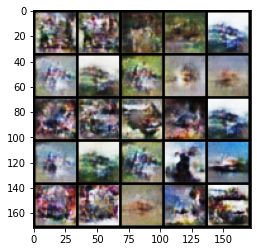

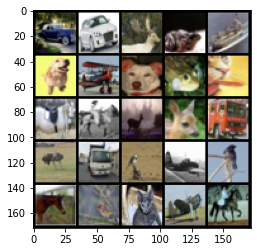

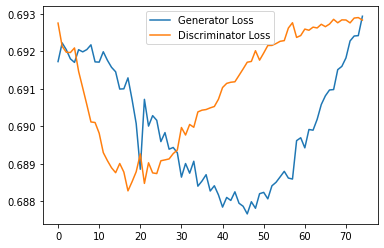

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 2000: Generator loss: 0.6951710565090179, discriminator loss: 0.6930266436338425


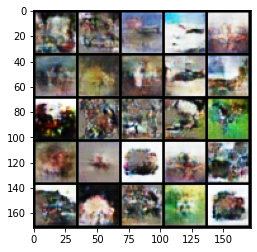

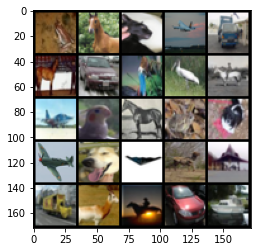

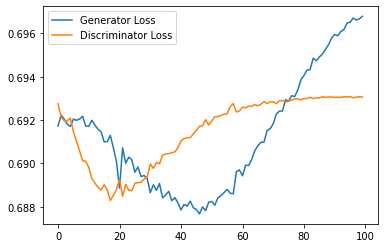

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 2500: Generator loss: 0.6975526494979858, discriminator loss: 0.6931078604459763


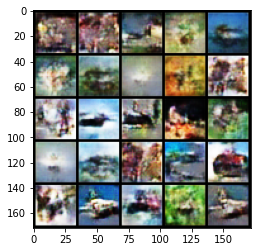

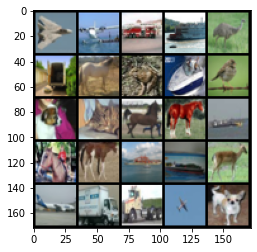

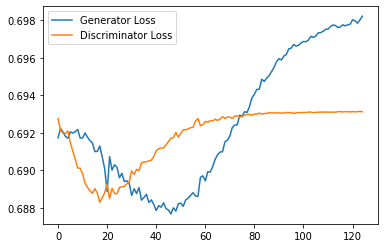

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 3000: Generator loss: 0.6982005338668823, discriminator loss: 0.6931422908306122


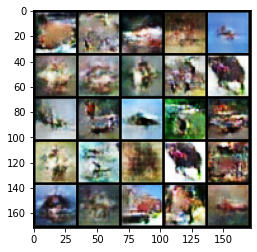

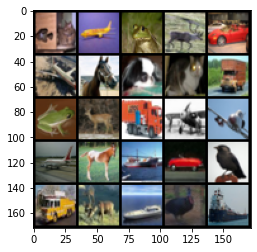

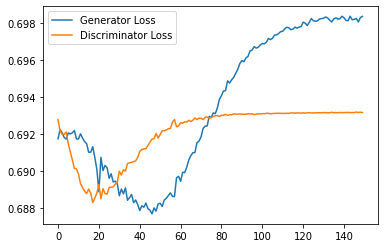

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 3500: Generator loss: 0.6982678384780884, discriminator loss: 0.6931577370166778


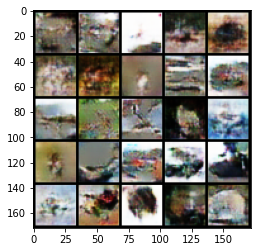

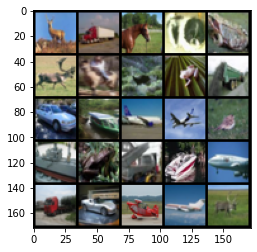

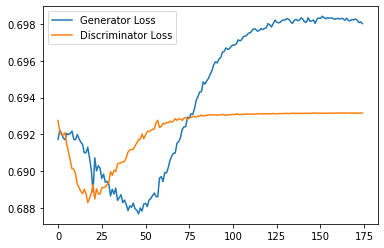

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 4000: Generator loss: 0.6977548549175262, discriminator loss: 0.6931581978797913


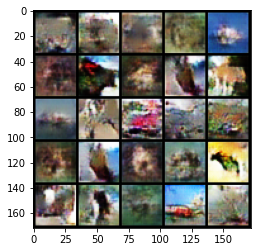

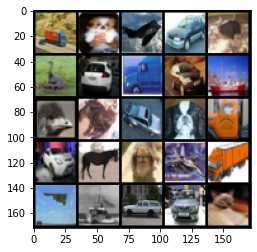

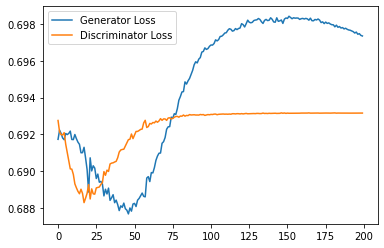

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 4500: Generator loss: 0.6970087940692902, discriminator loss: 0.6931532882452011


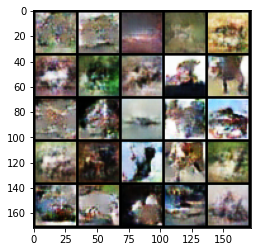

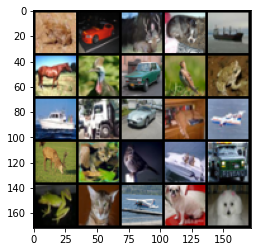

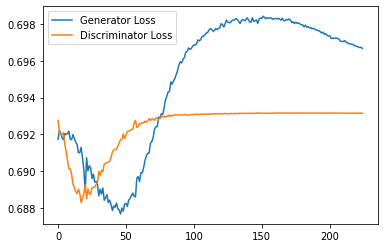

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 5000: Generator loss: 0.6964011503458023, discriminator loss: 0.6931504673957825


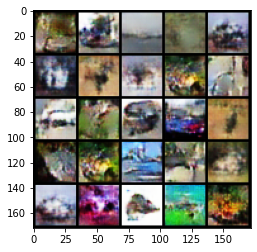

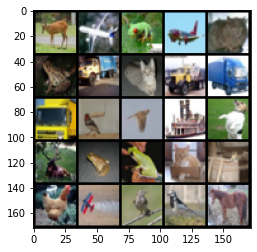

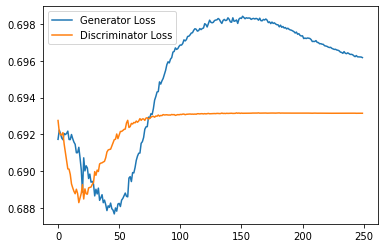

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 5500: Generator loss: 0.6959584691524505, discriminator loss: 0.6931494512557983


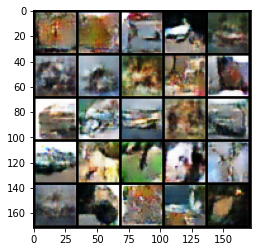

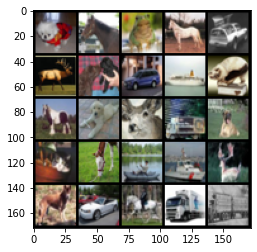

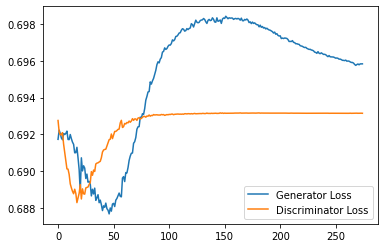

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 6000: Generator loss: 0.6956564328670501, discriminator loss: 0.6931484030485153


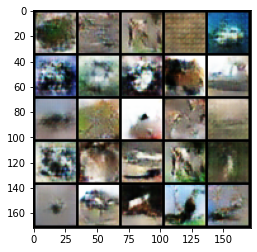

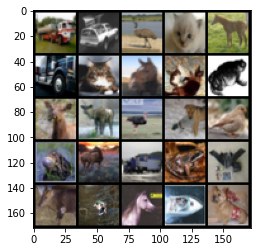

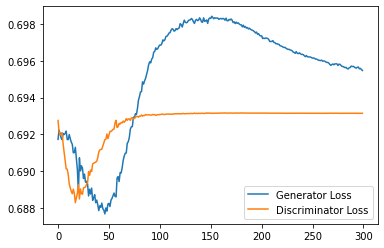

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 6500: Generator loss: 0.6954539452791214, discriminator loss: 0.6931467388868332


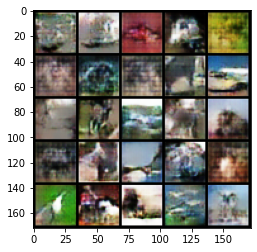

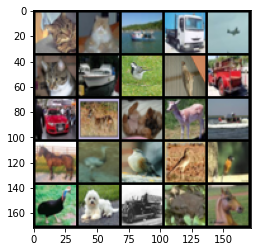

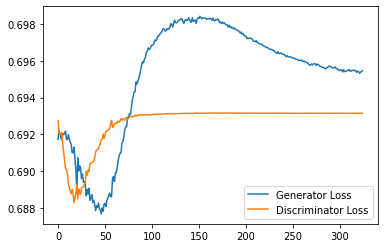

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 7000: Generator loss: 0.6952792028188706, discriminator loss: 0.6931452137231827


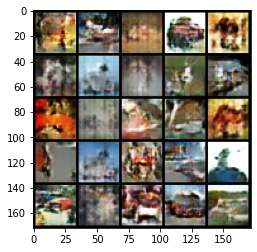

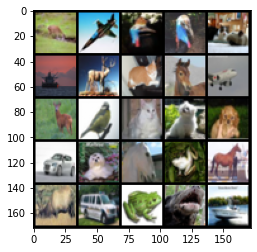

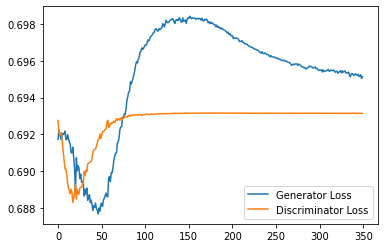

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 7500: Generator loss: 0.69515252161026, discriminator loss: 0.6931434717178345


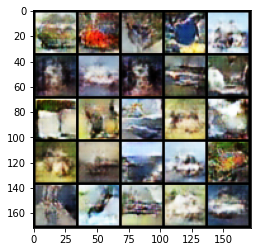

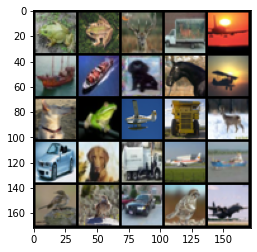

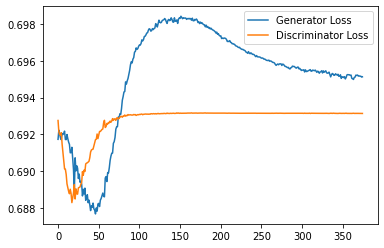

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 8000: Generator loss: 0.6951100785732269, discriminator loss: 0.6931428645849228


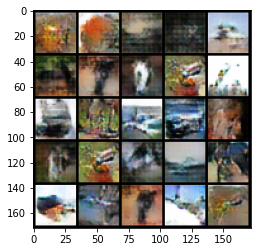

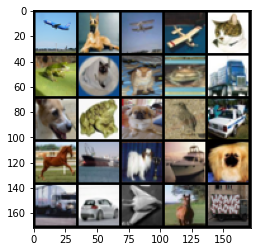

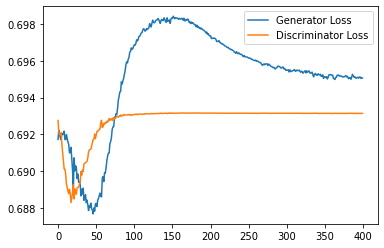

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 8500: Generator loss: 0.6950065698623658, discriminator loss: 0.6931420866250991


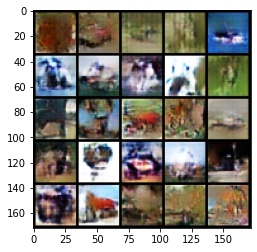

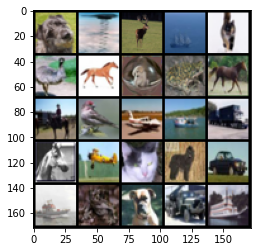

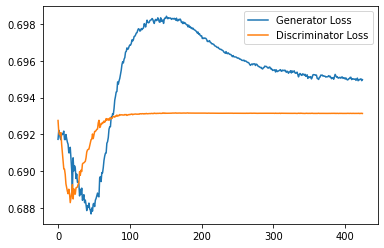

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 9000: Generator loss: 0.6949643696546555, discriminator loss: 0.693141435623169


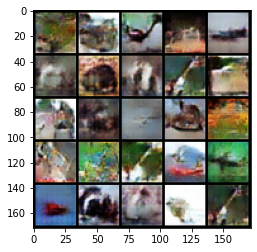

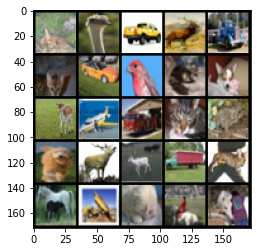

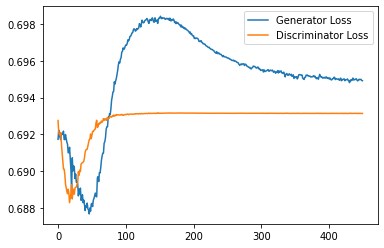

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 9500: Generator loss: 0.6949113805294037, discriminator loss: 0.6931412720680237


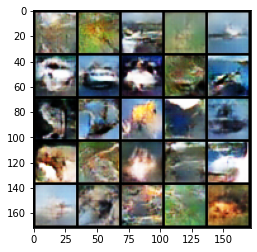

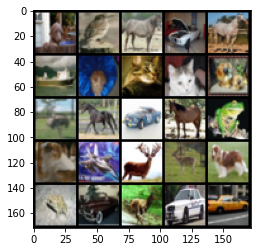

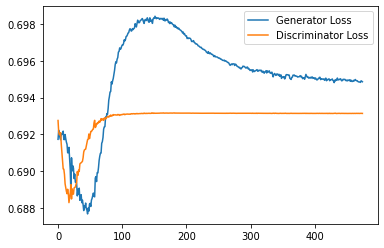

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 10000: Generator loss: 0.6948094148635864, discriminator loss: 0.693143597126007


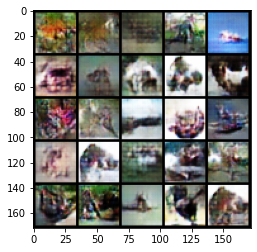

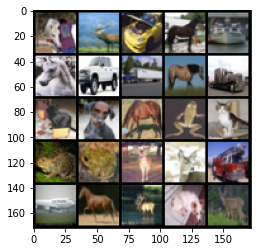

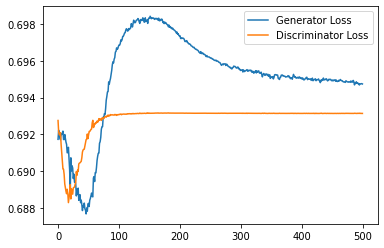

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 10500: Generator loss: 0.6946773128509521, discriminator loss: 0.6931435083150863


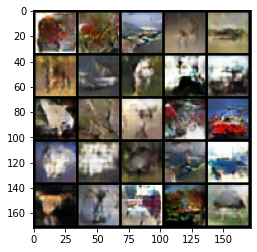

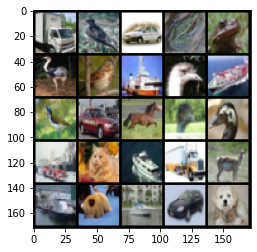

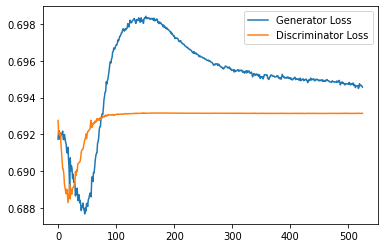

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 11000: Generator loss: 0.6946175260543823, discriminator loss: 0.6931423946619034


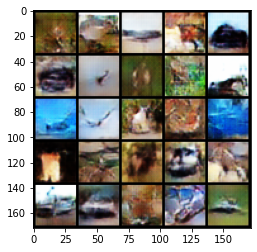

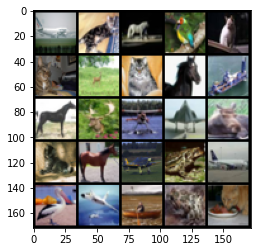

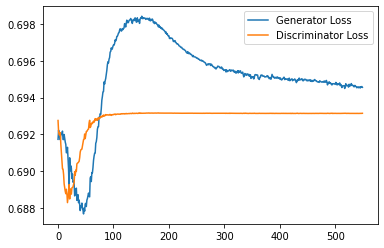

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 11500: Generator loss: 0.6944198025465012, discriminator loss: 0.6931447778940201


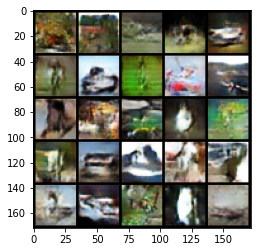

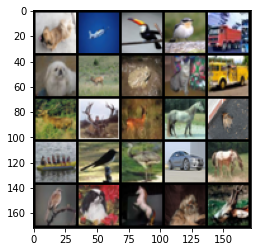

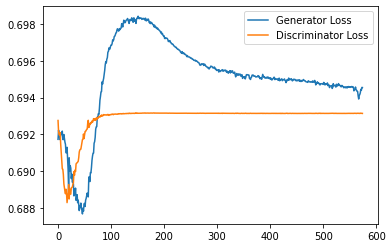

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 12000: Generator loss: 0.6944887251853943, discriminator loss: 0.693142484664917


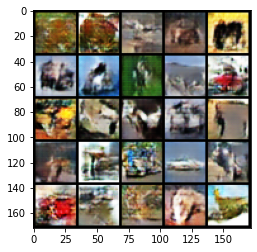

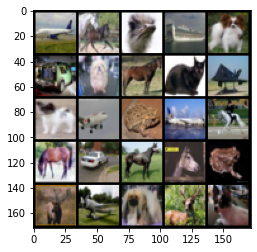

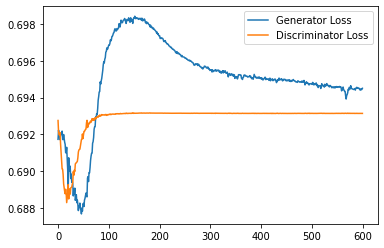

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 12500: Generator loss: 0.6945044993162155, discriminator loss: 0.6931415531635284


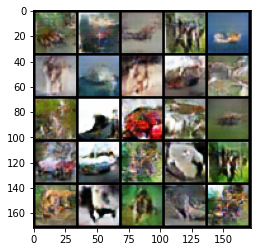

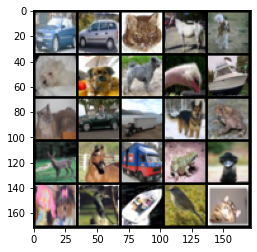

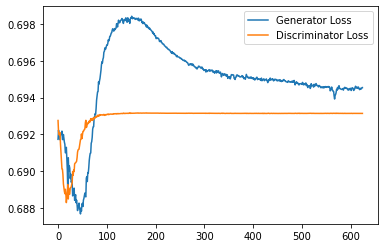

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 13000: Generator loss: 0.6944930543899536, discriminator loss: 0.6931418119668961


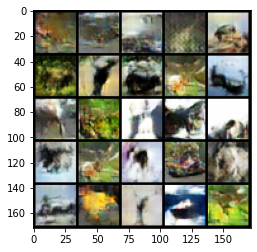

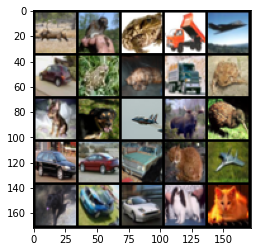

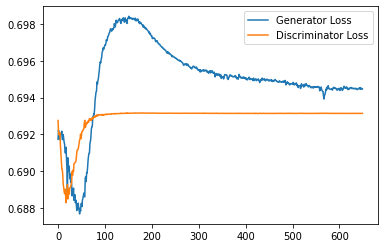

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 13500: Generator loss: 0.694492094874382, discriminator loss: 0.6931412224769592


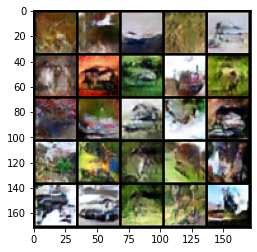

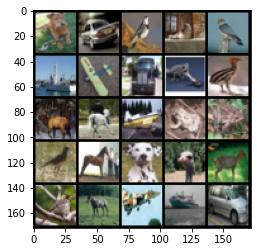

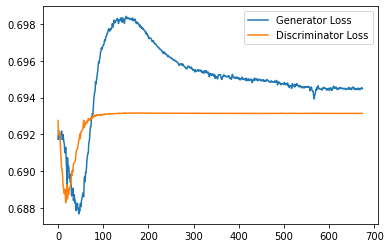

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 14000: Generator loss: 0.6945499260425567, discriminator loss: 0.6931415712833404


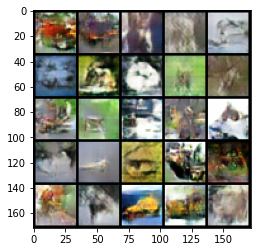

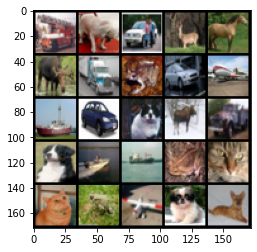

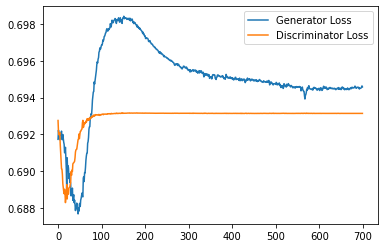

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 14500: Generator loss: 0.6945294361114502, discriminator loss: 0.6931411726474762


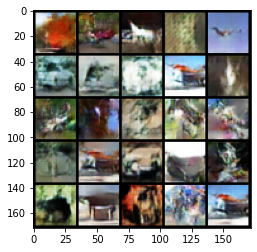

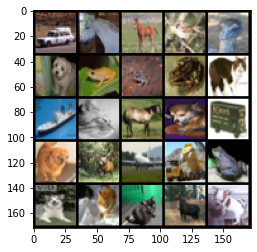

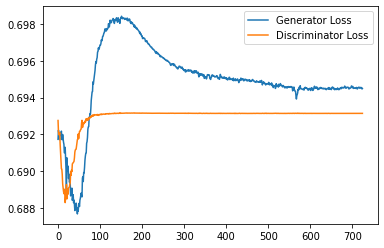

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 15000: Generator loss: 0.6945253927707672, discriminator loss: 0.6931415674686432


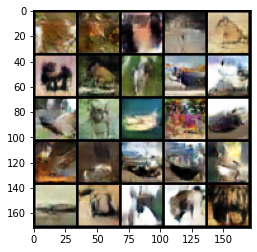

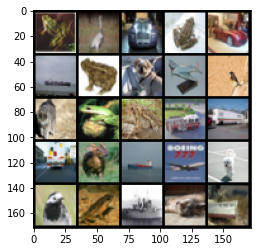

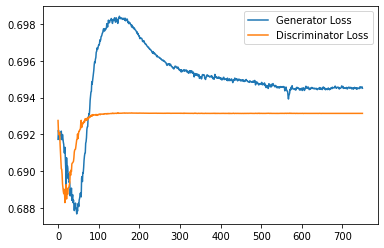

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 15500: Generator loss: 0.6945660287141799, discriminator loss: 0.6931413145065307


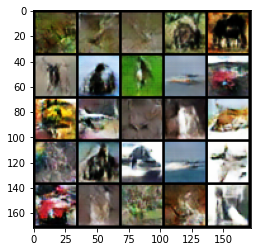

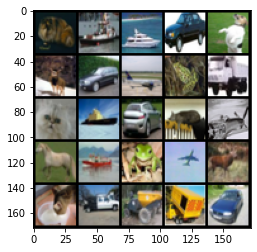

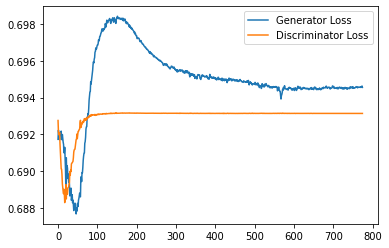

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 16000: Generator loss: 0.6945747961997986, discriminator loss: 0.6931422510147095


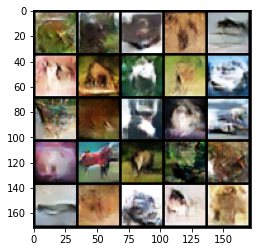

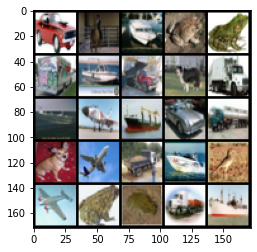

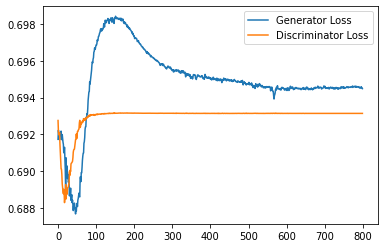

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 16500: Generator loss: 0.6945430386066437, discriminator loss: 0.6931420404911042


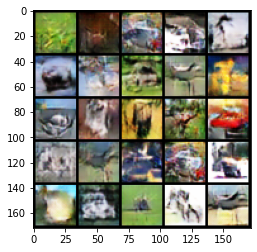

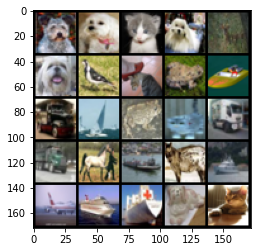

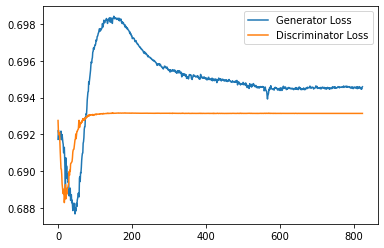

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 17000: Generator loss: 0.6944773919582367, discriminator loss: 0.6931420584917068


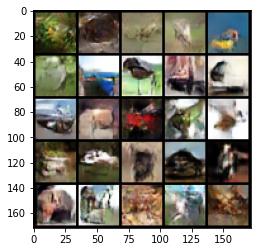

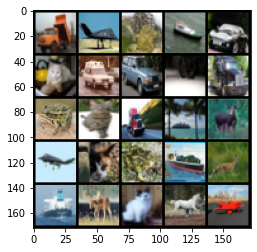

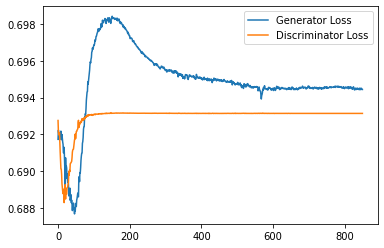

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 17500: Generator loss: 0.6945076283216477, discriminator loss: 0.6931416263580322


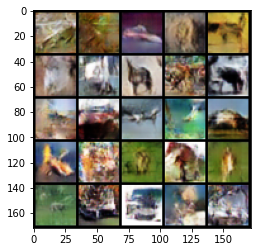

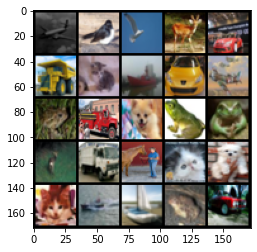

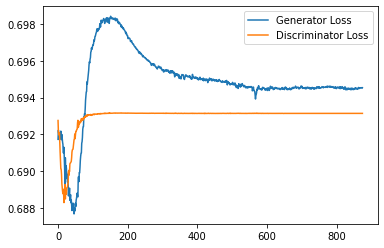

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 18000: Generator loss: 0.6945646513700485, discriminator loss: 0.6931421958208084


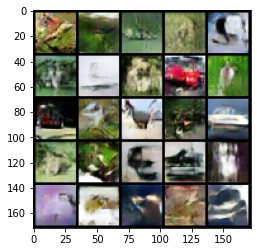

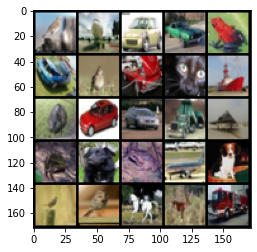

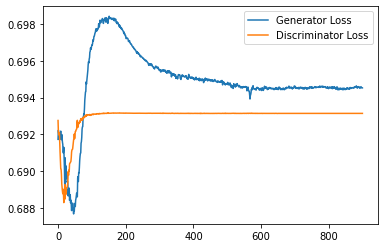

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 18500: Generator loss: 0.6945130124092102, discriminator loss: 0.6931428409814835


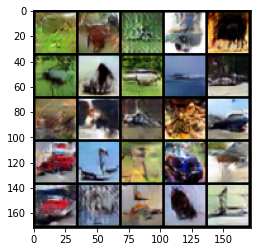

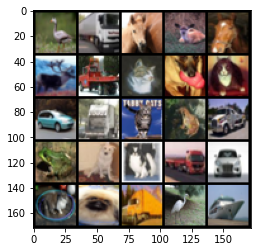

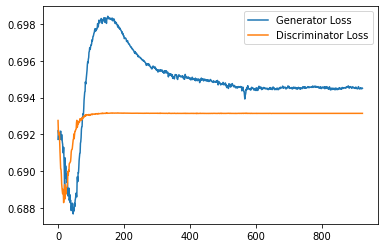

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 19000: Generator loss: 0.6945034345388412, discriminator loss: 0.6931430728435516


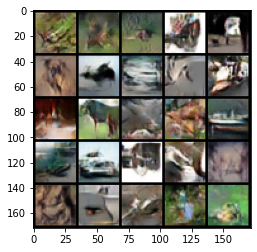

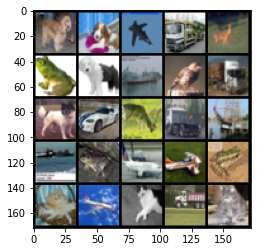

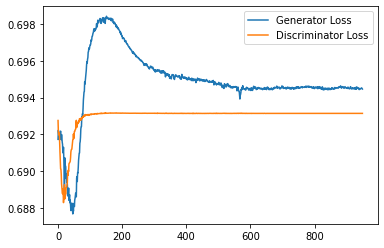

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 19500: Generator loss: 0.6944667195081711, discriminator loss: 0.6931431963443756


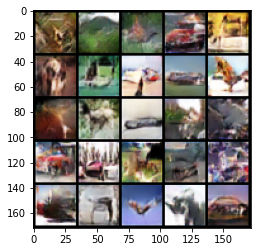

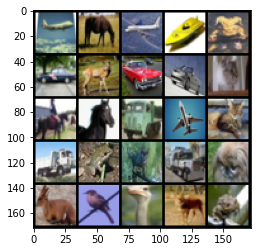

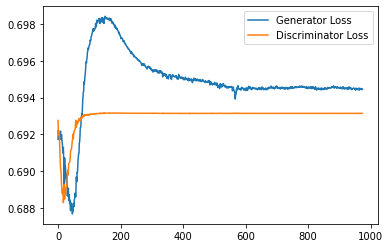

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 20000: Generator loss: 0.6944794343709946, discriminator loss: 0.6931436760425568


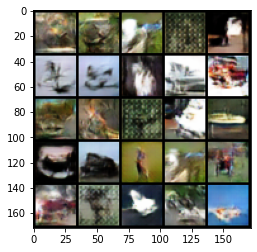

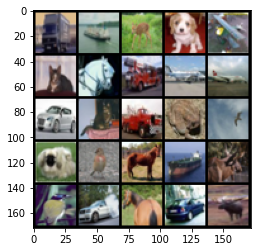

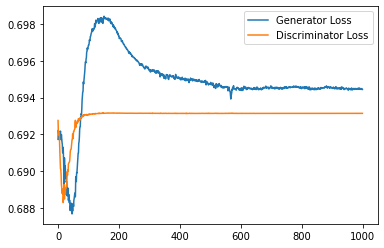

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 20500: Generator loss: 0.6944439285993576, discriminator loss: 0.6931441881656647


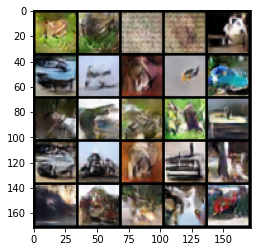

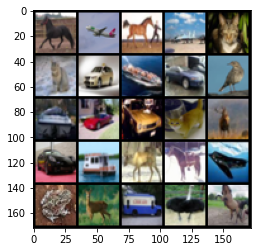

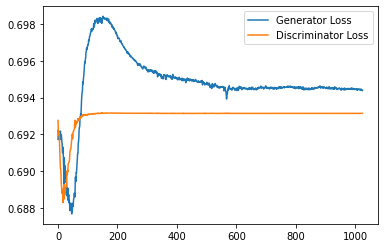

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 21000: Generator loss: 0.694340626001358, discriminator loss: 0.6931442054510116


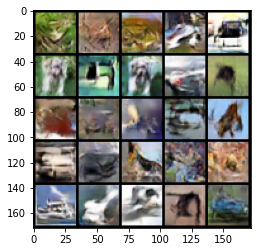

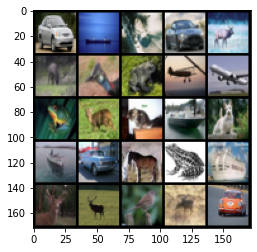

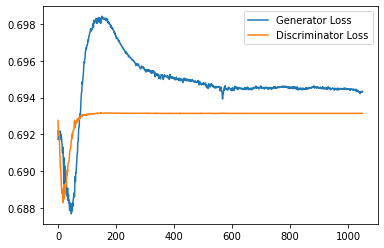

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 21500: Generator loss: 0.694344255566597, discriminator loss: 0.693143399477005


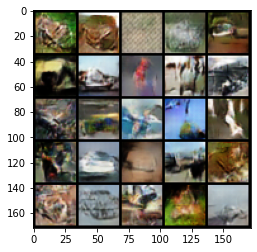

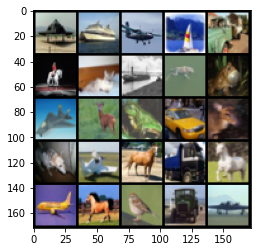

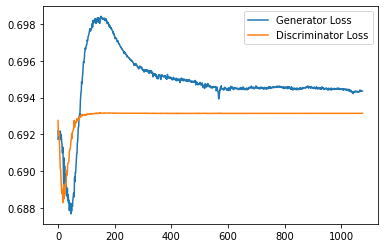

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 22000: Generator loss: 0.6943752459287643, discriminator loss: 0.6931439726352692


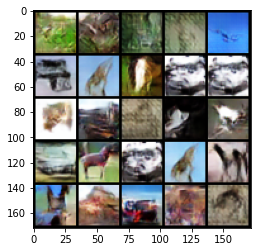

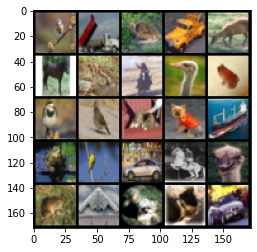

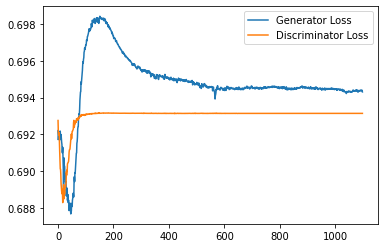

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 22500: Generator loss: 0.6943637461662292, discriminator loss: 0.6931442177295685


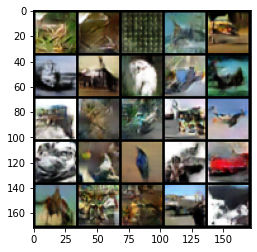

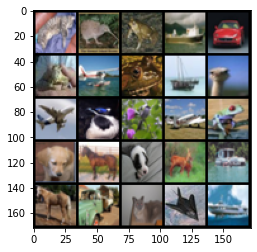

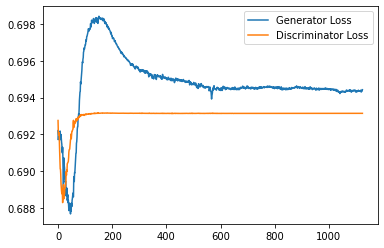

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 23000: Generator loss: 0.6943493250608445, discriminator loss: 0.6931444466114044


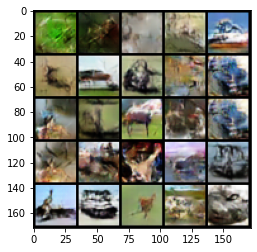

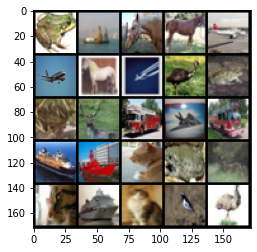

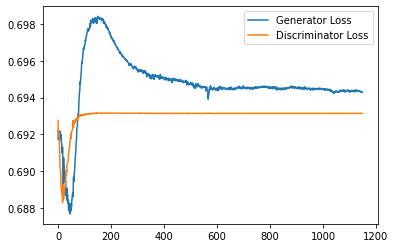

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 23500: Generator loss: 0.6943268204927444, discriminator loss: 0.6931445187330246


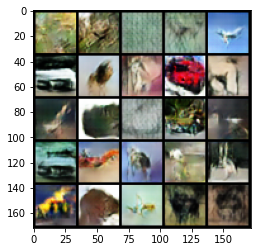

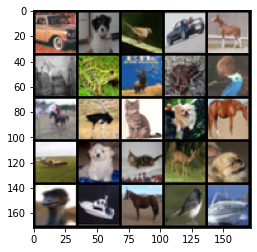

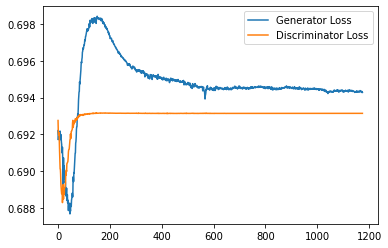

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 24000: Generator loss: 0.6943013793230057, discriminator loss: 0.6931445178985596


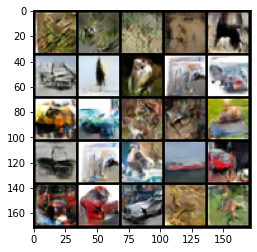

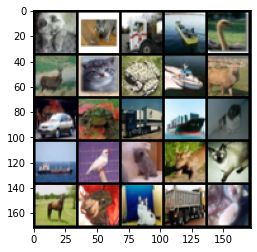

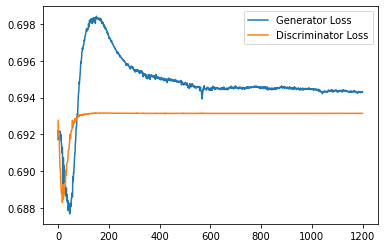

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 24500: Generator loss: 0.6943031797409057, discriminator loss: 0.6931447657346725


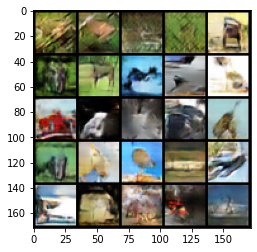

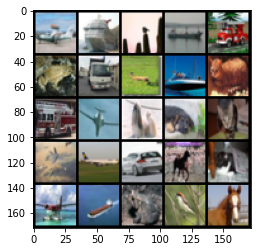

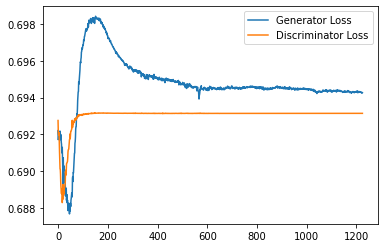

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 25000: Generator loss: 0.6942788805961609, discriminator loss: 0.6931450735330582


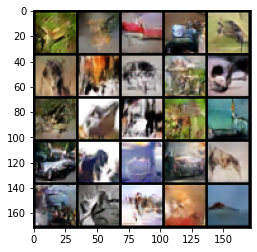

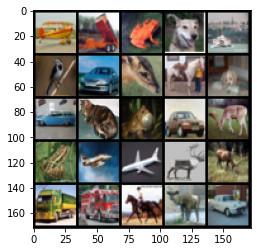

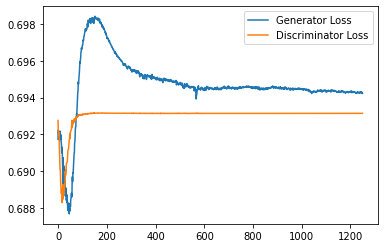

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 25500: Generator loss: 0.6942428110837936, discriminator loss: 0.6931451241970062


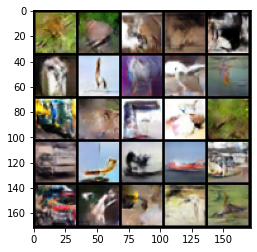

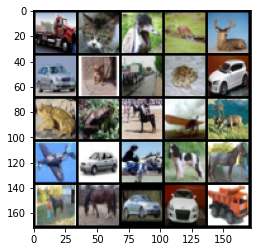

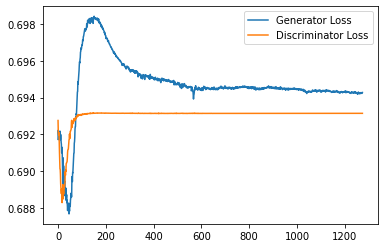

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 26000: Generator loss: 0.6942367135286331, discriminator loss: 0.6931451826095582


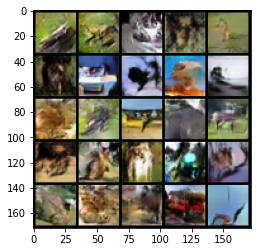

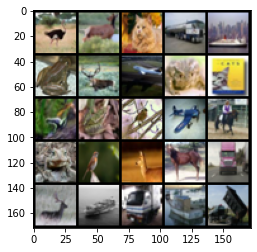

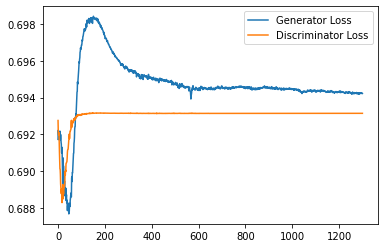

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 26500: Generator loss: 0.6942404297590256, discriminator loss: 0.6931455805301666


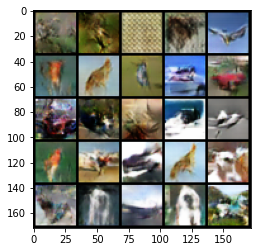

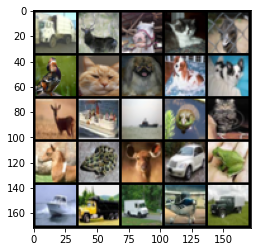

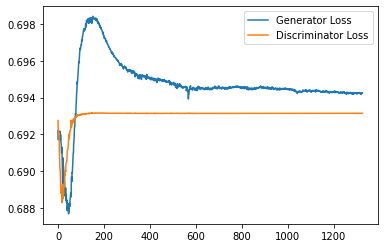

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 27000: Generator loss: 0.6942007908821106, discriminator loss: 0.6931455707550049


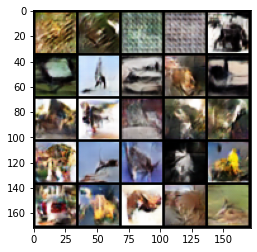

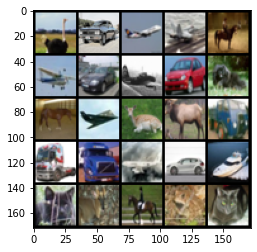

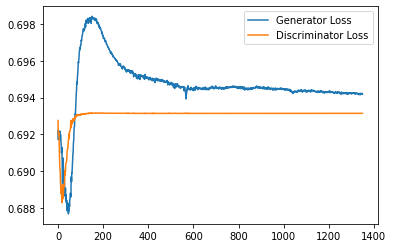

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 27500: Generator loss: 0.6941790746450425, discriminator loss: 0.6931458342075348


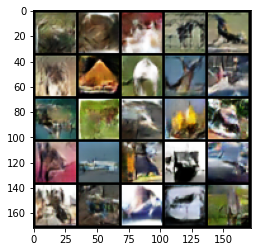

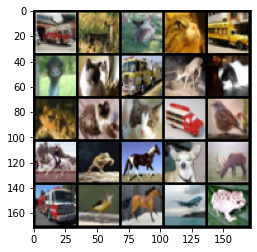

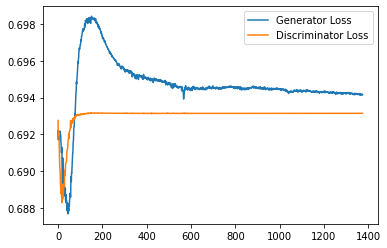

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

Step 28000: Generator loss: 0.6941381690502166, discriminator loss: 0.6931457951068878


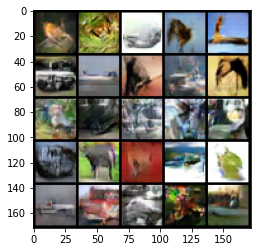

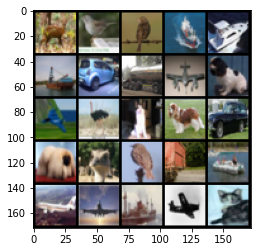

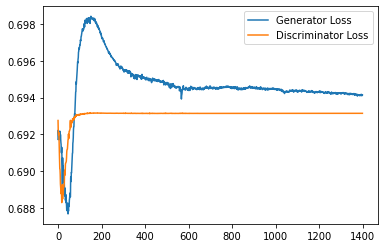

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

In [ ]:
cur_step = 0
generator_losses = []
discriminator_losses = []

for epoch in range(n_epochs):
    for data,labels in tqdm(dataloader_train):
        cur_batch_size = data.shape[0]

        data = data.to(device)
        #noise =
        one_hot_disc = get_one_hot_labels(labels.to(device), 10)
        # gen_inp = combine_vectors(noise,one_hot)
        gen_inp = get_noise(cur_batch_size,z_dim,device)

        disc_opt.zero_grad()
        # print(gen_inp.shape)
        # print("--",gen_inp.ndim)
        # print(gen_inp[:][0].shape)
        gen_out, new_labels = gen(gen_inp,labels)
        new_labels = new_labels.to(torch.int64)
        one_hot_gen = get_one_hot_labels(new_labels, 10)

        disc_inp_fake = gen_out.detach() #combine_vectors(gen_out.detach(), image_one_hot)
        #print(disc_inp_fake.shape, one_hot.shape)
        disc_inp_real = data #combine_vectors(data, image_one_hot)
        disc_fake_pred = disc(disc_inp_fake,one_hot_gen)
        disc_real_pred = disc(disc_inp_real,one_hot_disc)
        disc_out = torch.cat((disc_fake_pred,disc_real_pred),dim=1)
        actual_labels = torch.cat((torch.zeros_like(disc_fake_pred),torch.ones_like(disc_real_pred)),dim=1)
        disc_loss = criterion(disc_out,actual_labels)

        disc_fake_loss = criterion(disc_out,actual_labels)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()
        
        discriminator_losses += [disc_loss.item()]

        gen_opt.zero_grad()

        disc_fake_pred = disc(gen_out,one_hot_gen)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        generator_losses += [gen_loss.item()]


        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(gen_out)
            show_tensor_images(data)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        elif cur_step == 0:
            print("Working Now !")
        cur_step += 1

        


In [ ]:
PATH1 = "/content/drive/MyDrive/Colab Notebooks/data/Cond_model2.pth"
torch.save(gen.state_dict(),PATH1)

In [ ]:
PATH = "/content/drive/MyDrive/Colab Notebooks/data/Cond_model1.pth"
torch.save(gen.state_dict(),PATH)